In [18]:
import sys
sys.path = [p for p in sys.path if "ParaView" not in p]


import torch as pt
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.tri as mtri
from flowtorch import DATASETS
from flowtorch.data import FOAMDataloader, mask_box
from pydmd import DMD, ParametricDMD, HODMD
from ezyrb import POD, Database, RBF, GPR, Linear

from pathlib import Path
import re
# For High Quality Visuals
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 160  # crisp visuals


In [19]:
from inspect import getsource
print(getsource(HODMD))


class HODMD(HankelDMD):
    """
    Higher Order Dynamic Mode Decomposition

    :param svd_rank: the rank for the truncation; If 0, the method computes the
        optimal rank and uses it for truncation; if positive interger, the
        method uses the argument for the truncation; if float between 0 and 1,
        the rank is the number of the biggest singular values that are needed
        to reach the 'energy' specified by `svd_rank`; if -1, the method does
        not compute truncation.
    :type svd_rank: int or float
    :param int tlsq_rank: rank truncation computing Total Least Square. Default
        is 0, that means no truncation.
    :param bool exact: flag to compute either exact DMD or projected DMD.
        Default is False.
    :param opt: argument to control the computation of DMD modes amplitudes.
        See :class:`DMDBase`. Default is False.
    :type opt: bool or int
    :param rescale_mode: Scale Atilde as shown in
            10.1016/j.jneumeth.2015.10.010 (se

In [20]:
# Parameters
Re_list = [ 400, 410, 420, 430, 440, 460, 470, 480, 490, 500]  # Reynolds numbers


In [21]:
print(dir(ParametricDMD))


['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_arrange_parametric_snapshots', '_compute_training_modal_coefficients', '_interpolate_missing_modal_coefficients', '_predict_modal_coefficients', '_reference_dmd', '_set_training_parameters', 'dmd_time', 'dmd_timesteps', 'fit', 'forecasted_modal_coefficients', 'interpolated_modal_coefficients', 'is_partitioned', 'load', 'original_time', 'original_timesteps', 'parameters', 'reconstructed_data', 'save', 'training_modal_coefficients', 'training_parameters']


In [22]:
# Load and prepare data

# Base path to simulation folders
base_path = Path("~/OpenFOAM/test").expanduser()
Re_folders = {Re: base_path / f"cylinder_2D_Re{Re}" for Re in Re_list}

# Sampling step for downsampling snapshots
sampling_step = 1

# Dictionaries to store all relevant data
snapshot_dict = {}
sampled_times_dict = {}
mask_dict = {}
num_points_dict = {}
loader_dict = {}
masked_coords_dict = {}  

# Additional dictionaries for future-time snapshots (15.0–20.0)
snapshot_future_dict = {}
sampled_times_future_dict = {}

# Function to load and mask velocity snapshots
def load_masked_matrix(loader, mask, times):
    num_points = mask.sum().item()
    num_times = len(times)
    data_matrix = pt.zeros((2 * num_points, num_times), dtype=pt.float64)

    for i, time in enumerate(times):
        snapshot = loader.load_snapshot("U", time)
        ux_masked = pt.masked_select(snapshot[:, 0], mask)
        uy_masked = pt.masked_select(snapshot[:, 1], mask)
        data_matrix[:num_points, i] = ux_masked
        data_matrix[num_points:, i] = uy_masked

    return data_matrix.numpy(), num_points

# Loop through each Re and load data
for Re in Re_list:
    folder = Re_folders[Re]
    loader = FOAMDataloader(str(folder))
    times = loader.write_times

    # Filter and downsample time steps for training (10.0–15.0)
    window_times = [t for t in times if 10.0 <= float(t) <= 15.0]
    sampled_times = window_times[::sampling_step]

    # Create spatial mask for cylinder region
    vertices = loader.vertices[:, :2]
    mask = mask_box(vertices, lower=[0.1, -1], upper=[0.75, 1])
    masked_coords = vertices[mask.numpy()]  # Extract masked coordinates

    # Load masked velocity snapshots for training
    data_matrix, num_points = load_masked_matrix(loader, mask, sampled_times)

    # Store training data
    snapshot_dict[Re] = data_matrix
    sampled_times_dict[Re] = sampled_times
    mask_dict[Re] = mask
    num_points_dict[Re] = num_points
    loader_dict[Re] = loader
    masked_coords_dict[Re] = masked_coords 

    # Optional: Load future snapshots for validation/forecasting (15.0–20.0)
    future_window_times = [t for t in times if 15.0 <= float(t) <= 20.0]
    sampled_future_times = future_window_times[::sampling_step]

    if sampled_future_times:
        future_data_matrix, _ = load_masked_matrix(loader, mask, sampled_future_times)
        snapshot_future_dict[Re] = future_data_matrix
        sampled_times_future_dict[Re] = sampled_future_times

print("✅ Data loaded for Reynolds numbers:", Re_list)


INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor0/constant
INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor1/constant
INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor0/constant
INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor1/constant
INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor0/constant
INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor1/constant
INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor0/constant
INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor1/constant
INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor0/constant
INFO:flowtorch.data.foam_dataloader:Loading pr

✅ Data loaded for Reynolds numbers: [400, 410, 420, 430, 440, 460, 470, 480, 490, 500]


In [23]:
# Print the loaded data matrix shape for each Reynolds number
print("Data_matrix shape for each Re:",data_matrix.shape)

Data_matrix shape for each Re: (11492, 501)


In [24]:
for Re in Re_list:
    print(f"Re={Re}, shape={snapshot_dict[Re].shape}")


Re=400, shape=(11492, 501)
Re=410, shape=(11492, 501)
Re=420, shape=(11492, 501)
Re=430, shape=(11492, 501)
Re=440, shape=(11492, 501)
Re=460, shape=(11492, 501)
Re=470, shape=(11492, 501)
Re=480, shape=(11492, 501)
Re=490, shape=(11492, 501)
Re=500, shape=(11492, 501)


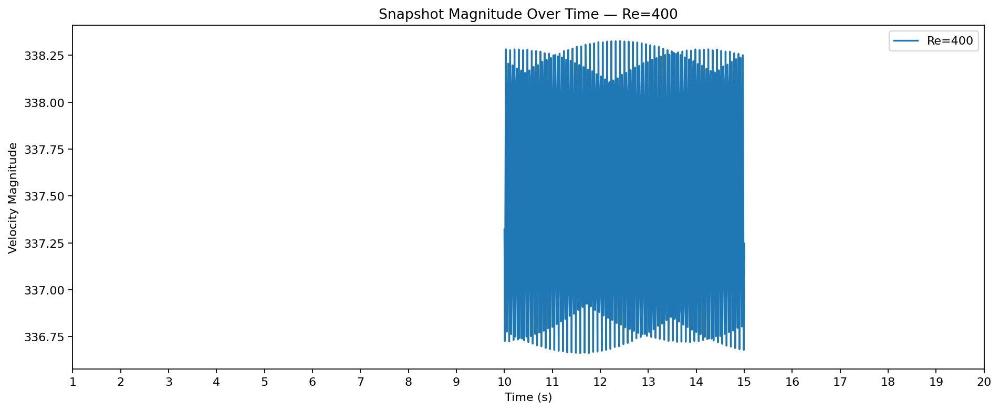

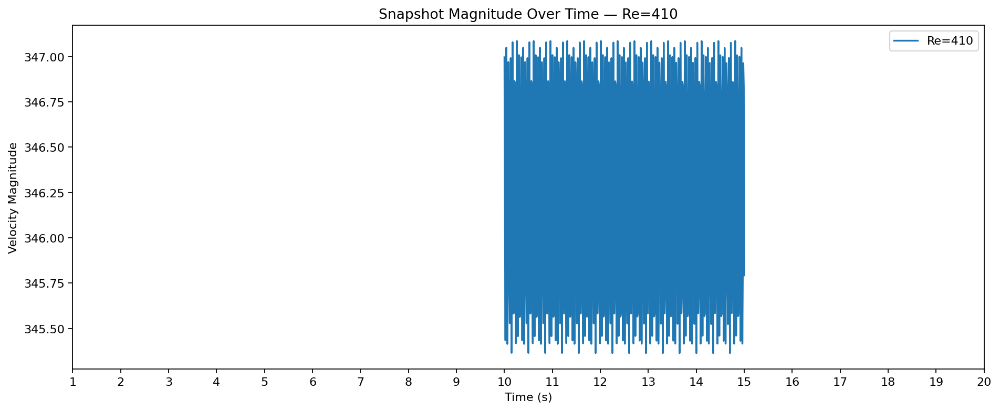

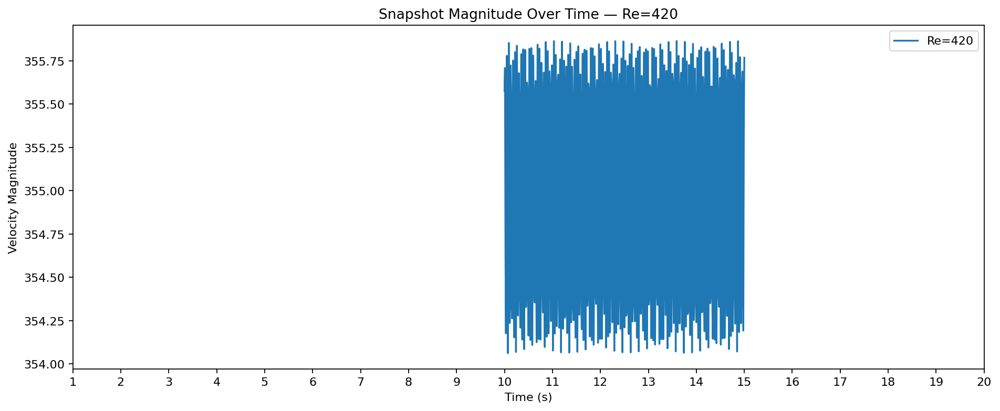

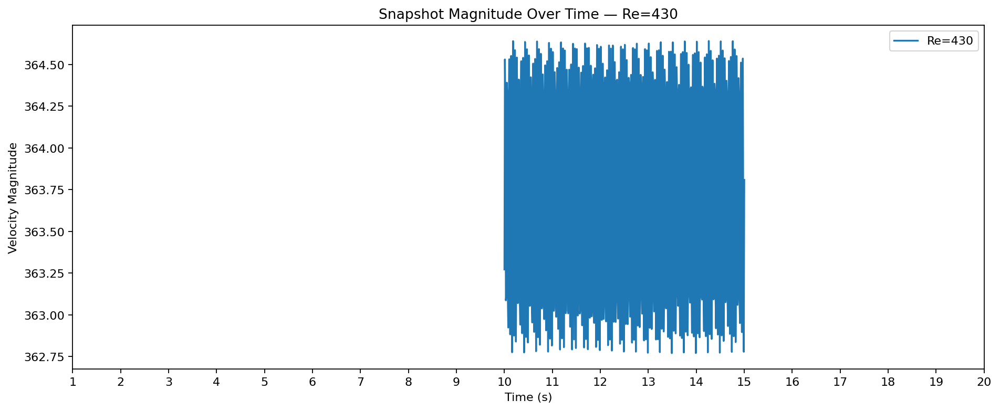

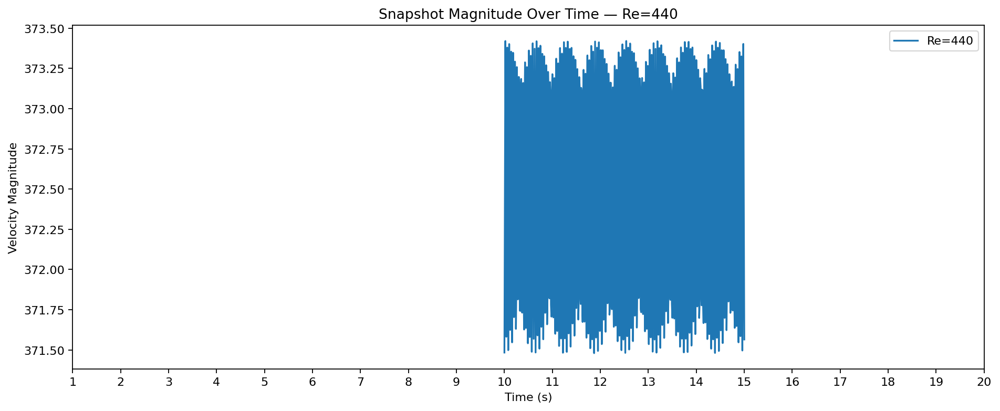

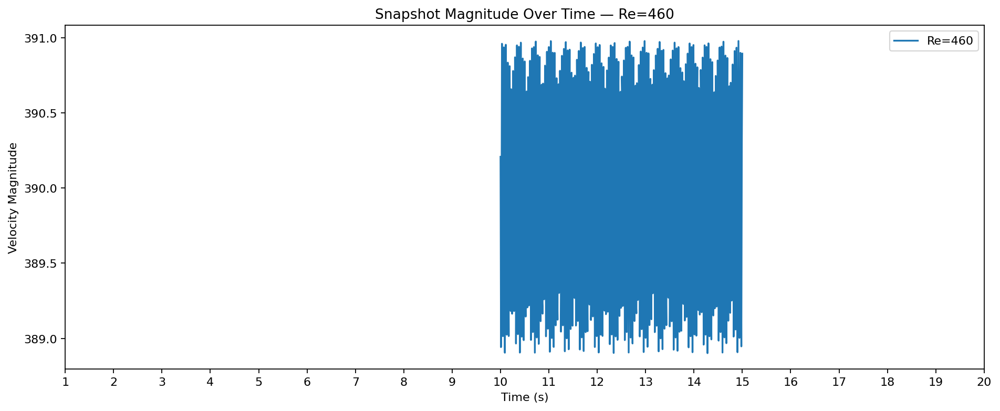

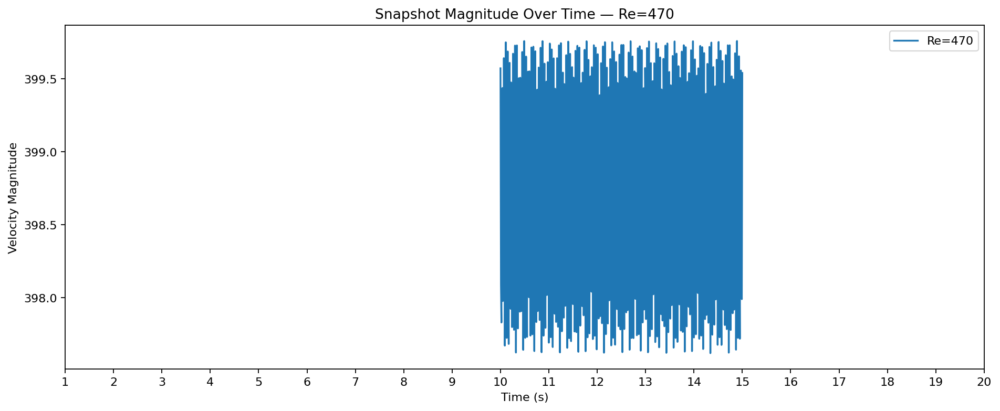

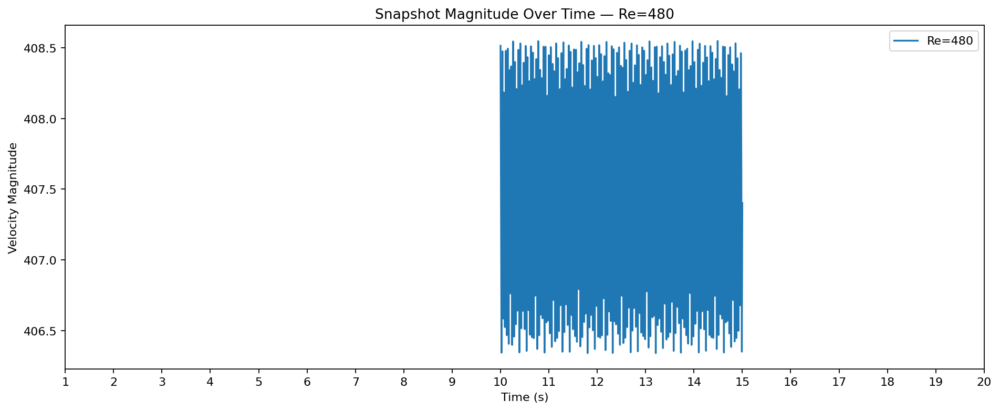

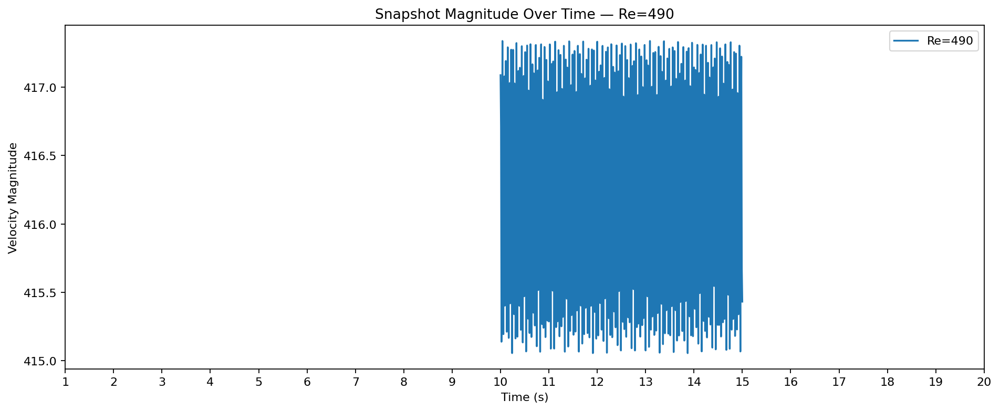

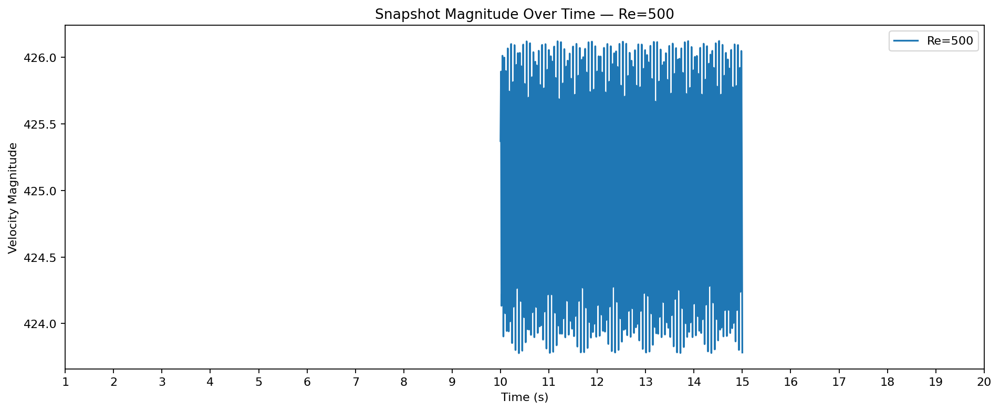

In [25]:
# Plot the snapshot magnitudes over time for each Re

for Re in Re_list:
    fig, ax = plt.subplots(figsize=(12, 5))  # Create a new figure for each Re

    mags = np.linalg.norm(snapshot_dict[Re], axis=0)
    times = np.array(sampled_times_dict[Re], dtype=float)

    ax.plot(times, mags, label=f"Re={Re}", color='tab:blue')

    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Velocity Magnitude")
    ax.set_title(f"Snapshot Magnitude Over Time — Re={Re}")
    ax.legend()

    # Set ticks every 1 second from 1 to 20
    ax.set_xticks(np.arange(1, 21, 1))

    plt.tight_layout()
    plt.show()


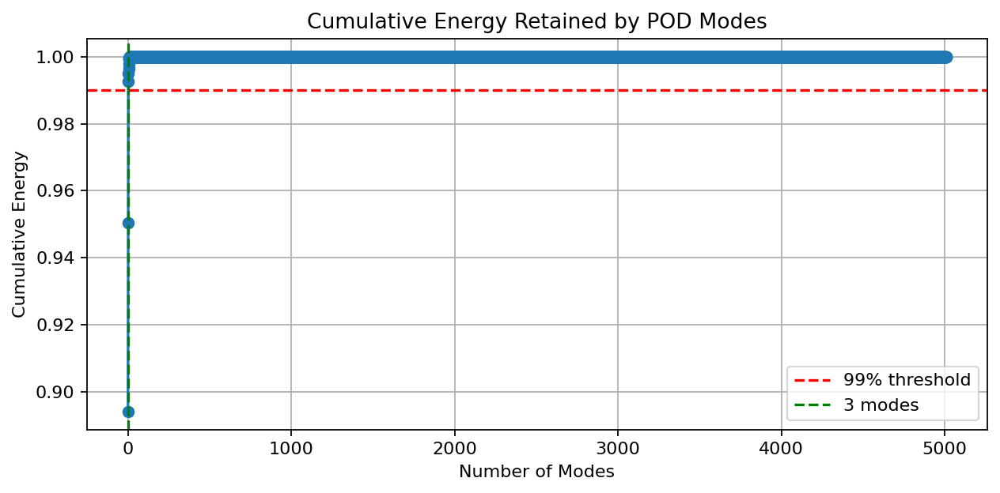

Number of POD modes needed to retain 99% energy: 3


In [26]:
# SVD of the snapshot matrix

snapshot_matrix = np.hstack([snapshot_dict[Re] for Re in Re_list])

U, s, Vh = np.linalg.svd(snapshot_matrix, full_matrices=False)

# Compute normalized energy
normalized_energy = s**2 / np.sum(s**2)
cumulative_energy = np.cumsum(normalized_energy)

# Find number of modes needed to reach 99% energy
threshold = 0.99
num_modes_99 = np.searchsorted(cumulative_energy, threshold) + 1  # +1 for 1-based indexing

# Plot cumulative energy
plt.figure(figsize=(8, 4))
plt.plot(np.arange(1, len(cumulative_energy) + 1), cumulative_energy, marker='o')
plt.axhline(threshold, color='red', linestyle='--', label='99% threshold')
plt.axvline(num_modes_99, color='green', linestyle='--', label=f'{num_modes_99} modes')
plt.title("Cumulative Energy Retained by POD Modes")
plt.xlabel("Number of Modes")
plt.ylabel("Cumulative Energy")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Print result
print(f"Number of POD modes needed to retain {threshold*100:.0f}% energy: {num_modes_99}")


In [27]:
## Offline Phase

## Step 1: Perform POD and DMD on the concatenated snapshot matrix X1

In [28]:
# POD and Parameteric DMD

# Shared POD basis across all Re
snapshot_matrix = np.hstack([snapshot_dict[Re] for Re in Re_list])
rom = POD(rank=30)
rom.fit(snapshot_matrix)

# Reduce each Re's snapshots to POD coefficients
pod_coeff_dict = {}
for Re in Re_list:
    pod_coeff_dict[Re] = rom.reduce(snapshot_dict[Re])  # shape: (modes, time)

# Fit HODMD for each Re
hodmd_dict = {}
for Re in Re_list:
    hodmd = HODMD(svd_rank=30, opt=True, exact=True, d=30)
    hodmd.fit(pod_coeff_dict[Re])
    hodmd.original_time["t0"] = 10.0
    hodmd.original_time["tend"] = 15.0
    hodmd.original_time["dt"] = 0.01
    hodmd.dmd_time["t0"] = 15.0
    hodmd.dmd_time["tend"] = 20.0
    hodmd.dmd_time["dt"] = 0.01
    hodmd_dict[Re] = hodmd



INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (390, 472), snapshot shape: (390,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (390, 472), snapshot shape: (390,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (390, 472), snapshot shape: (390,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (390, 472), snapshot shape: (390,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (390, 472), snapshot shape: (390,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (30, 501), snapshot shape: (30,)
INFO:root:Snapshots: (390, 472), snapshot shape: (390,)
INFO:root:Snapsh

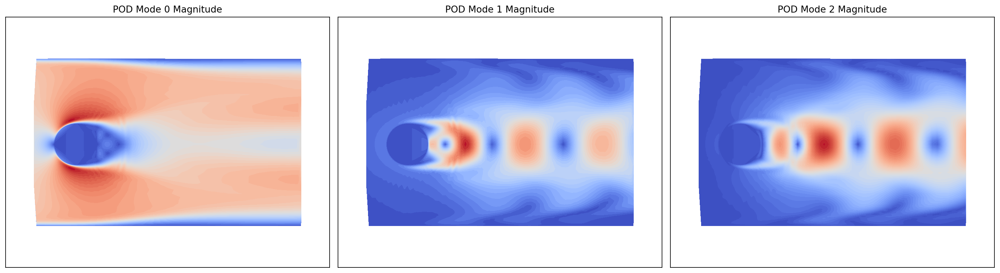

In [29]:
# Visualize the first 3 POD modes

# Get masked coordinates
x_masked = masked_coords_dict[Re_list[0]][:, 0]
y_masked = masked_coords_dict[Re_list[0]][:, 1]
tri = mtri.Triangulation(x_masked, y_masked)

# Split POD modes into ux and uy
num_points = masked_coords_dict[Re_list[0]].shape[0]
ux_modes = rom.modes[:num_points, :3].T  # shape: (3, 5746)
uy_modes = rom.modes[num_points:, :3].T  # shape: (3, 5746)

# Compute magnitude at each point
mag_modes = np.sqrt(ux_modes**2 + uy_modes**2)  # shape: (3, 5746)

# Plot
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i in range(3):
    ax = axes[i]
    mode_mag = mag_modes[i]
    ax.tricontourf(tri, mode_mag, levels=50, cmap="coolwarm")
    ax.set_title(f"POD Mode {i} Magnitude")
    ax.axis("equal")
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()


In [30]:
print("rom.modes shape:", rom.modes.shape)
print("masked_coords shape:", masked_coords_dict[Re_list[0]].shape)


rom.modes shape: (11492, 30)
masked_coords shape: torch.Size([5746, 2])


In [31]:
# Forecast POD coefficients from 15s to 20s
forecasted_pod_dict = {}
for Re in Re_list:
    forecasted_pod_dict[Re] = hodmd_dict[Re].reconstructed_data  # shape: (modes, time)

# Stack forecasted POD coefficients across Re
training_parameters = np.array(Re_list).reshape(-1, 1)
forecasted_pod_stack = np.stack([forecasted_pod_dict[Re] for Re in Re_list], axis=0)  # shape: (ntrain, modes, time)

# Interpolate at Re = 450
interpolated_pod = []
interpolator = RBF()
for i in range(forecasted_pod_stack.shape[1]):  # loop over modes
    interpolator.fit(training_parameters, forecasted_pod_stack[:, i, :])  # fit interpolator for mode i
    interpolated = interpolator.predict(np.array([[450]]))[0]  # predict time series for mode i
    interpolated_pod.append(interpolated)

interpolated_pod = np.stack(interpolated_pod, axis=0)  # shape: (modes, time)

# Expand interpolated POD coefficients to full field
forecasted_field = rom.expand(interpolated_pod)  # shape: (space_dim, time)

# Time vector from any HODMD instance
print("✅ Forecasting complete for Re = 450")
print("Time vector:", hodmd_dict[Re_list[0]].dmd_timesteps)


✅ Forecasting complete for Re = 450
Time vector: [15.   15.01 15.02 15.03 15.04 15.05 15.06 15.07 15.08 15.09 15.1  15.11
 15.12 15.13 15.14 15.15 15.16 15.17 15.18 15.19 15.2  15.21 15.22 15.23
 15.24 15.25 15.26 15.27 15.28 15.29 15.3  15.31 15.32 15.33 15.34 15.35
 15.36 15.37 15.38 15.39 15.4  15.41 15.42 15.43 15.44 15.45 15.46 15.47
 15.48 15.49 15.5  15.51 15.52 15.53 15.54 15.55 15.56 15.57 15.58 15.59
 15.6  15.61 15.62 15.63 15.64 15.65 15.66 15.67 15.68 15.69 15.7  15.71
 15.72 15.73 15.74 15.75 15.76 15.77 15.78 15.79 15.8  15.81 15.82 15.83
 15.84 15.85 15.86 15.87 15.88 15.89 15.9  15.91 15.92 15.93 15.94 15.95
 15.96 15.97 15.98 15.99 16.   16.01 16.02 16.03 16.04 16.05 16.06 16.07
 16.08 16.09 16.1  16.11 16.12 16.13 16.14 16.15 16.16 16.17 16.18 16.19
 16.2  16.21 16.22 16.23 16.24 16.25 16.26 16.27 16.28 16.29 16.3  16.31
 16.32 16.33 16.34 16.35 16.36 16.37 16.38 16.39 16.4  16.41 16.42 16.43
 16.44 16.45 16.46 16.47 16.48 16.49 16.5  16.51 16.52 16.53 16.54 16.55
 1

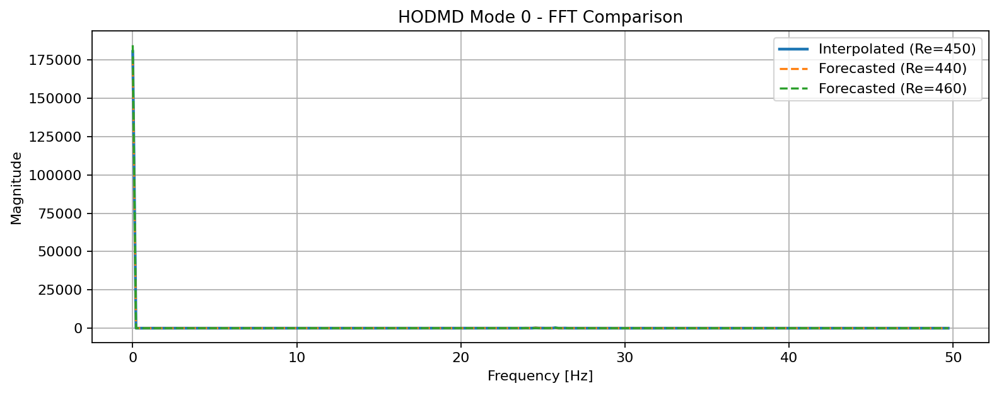

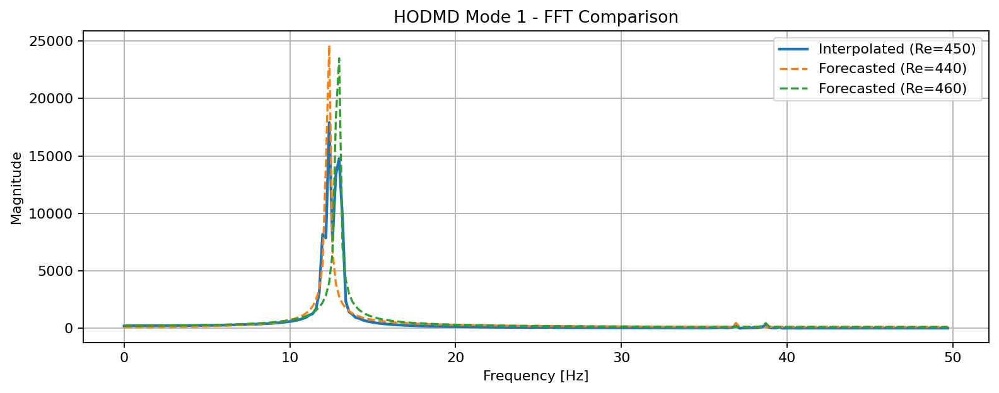

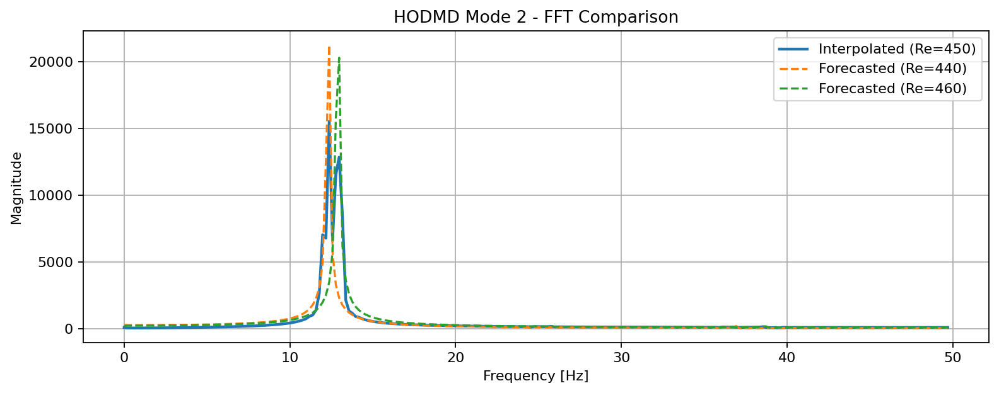

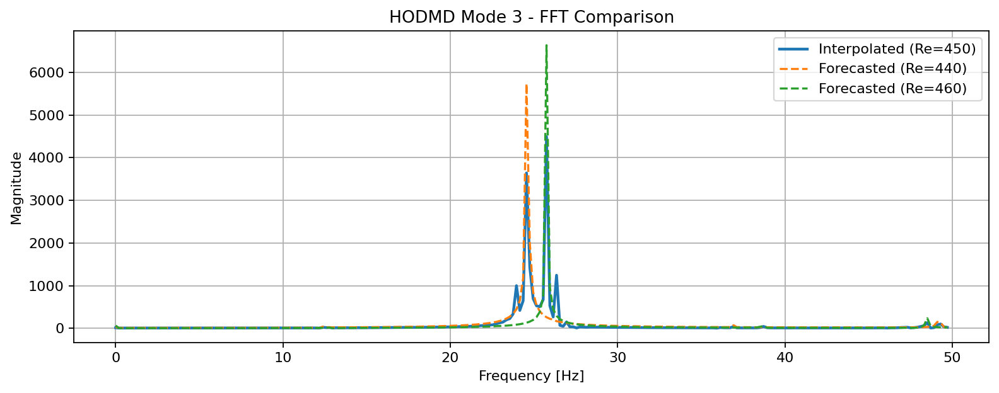

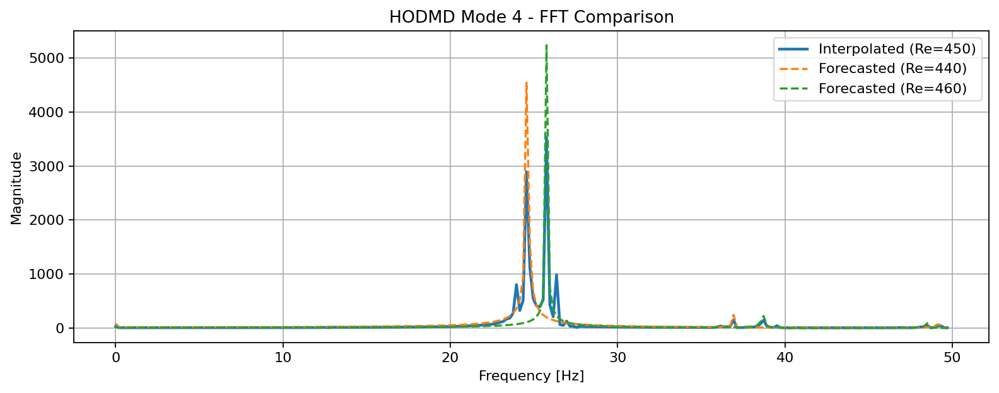

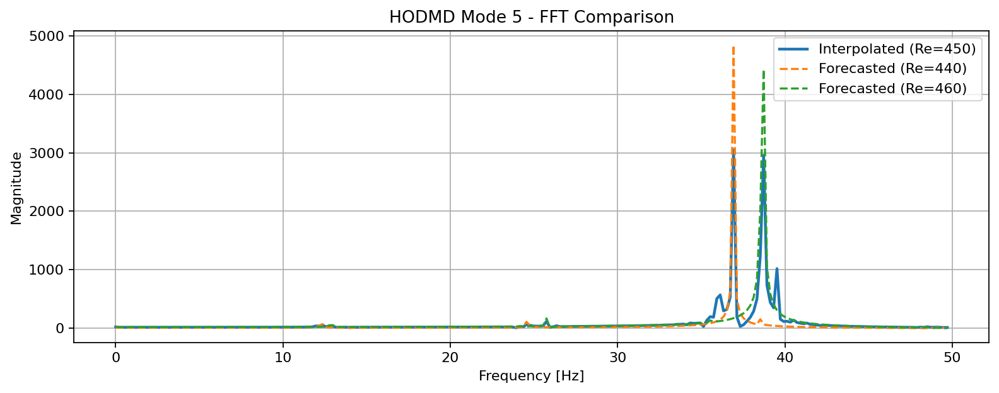

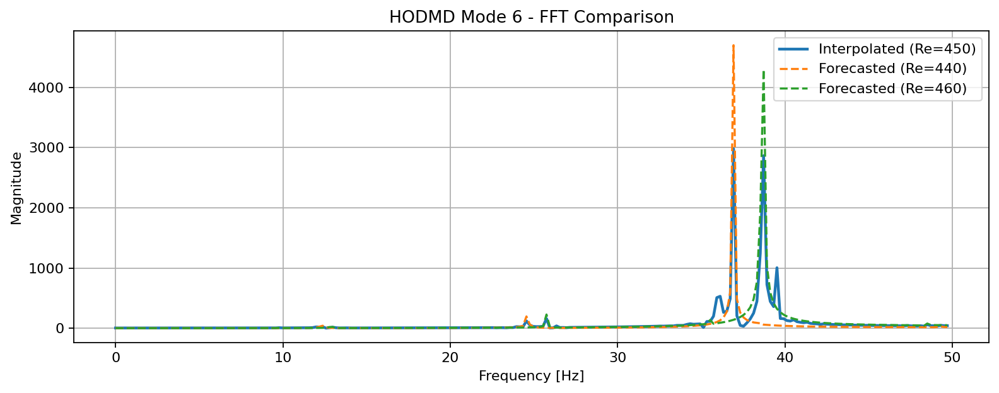

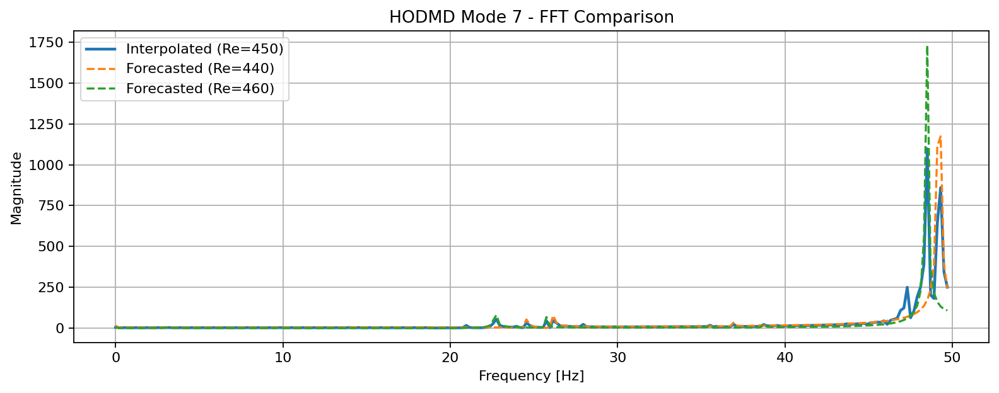

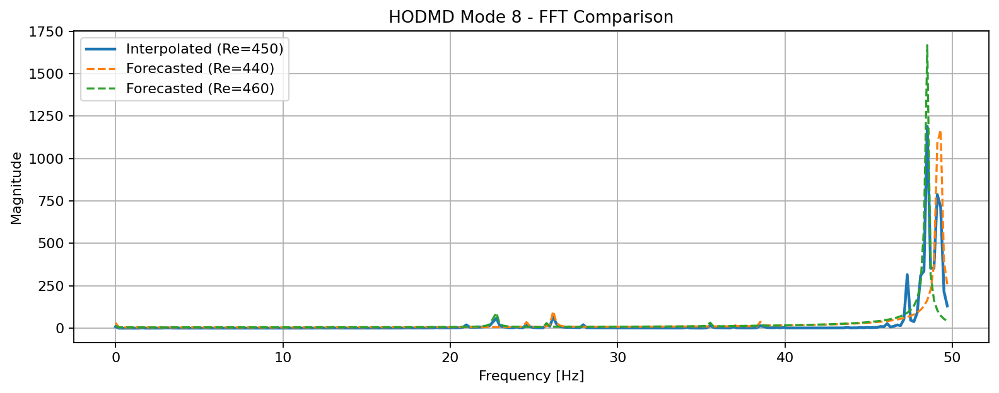

In [32]:
# FFT comparison of modes between interpolated and trained Re

from scipy.fft import fft, fftfreq
import matplotlib.pyplot as plt

# Setup
dt = 0.01  # same as hodmd.dmd_time["dt"]
n_timesteps = interpolated_pod.shape[1]
freqs = fftfreq(n_timesteps, d=dt)

# Neighbor indices
Re_array = np.array(Re_list)
i_440 = np.where(Re_array == 440)[0][0]
i_460 = np.where(Re_array == 460)[0][0]

# Compare selected modes
for mode in [0, 1, 2, 3, 4, 5, 6, 7, 8]:  # adjust as needed
    trace_450 = interpolated_pod[mode]
    trace_440 = forecasted_pod_stack[i_440, mode]
    trace_460 = forecasted_pod_stack[i_460, mode]

    # FFT magnitudes
    fft_450 = np.abs(fft(trace_450))[:n_timesteps//2]
    fft_440 = np.abs(fft(trace_440))[:n_timesteps//2]
    fft_460 = np.abs(fft(trace_460))[:n_timesteps//2]

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(freqs[:n_timesteps//2], fft_450, label="Interpolated (Re=450)", linewidth=2)
    plt.plot(freqs[:n_timesteps//2], fft_440, label="Forecasted (Re=440)", linestyle="--")
    plt.plot(freqs[:n_timesteps//2], fft_460, label="Forecasted (Re=460)", linestyle="--")
    plt.title(f"HODMD Mode {mode} - FFT Comparison")
    plt.xlabel("Frequency [Hz]")
    plt.ylabel("Magnitude")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


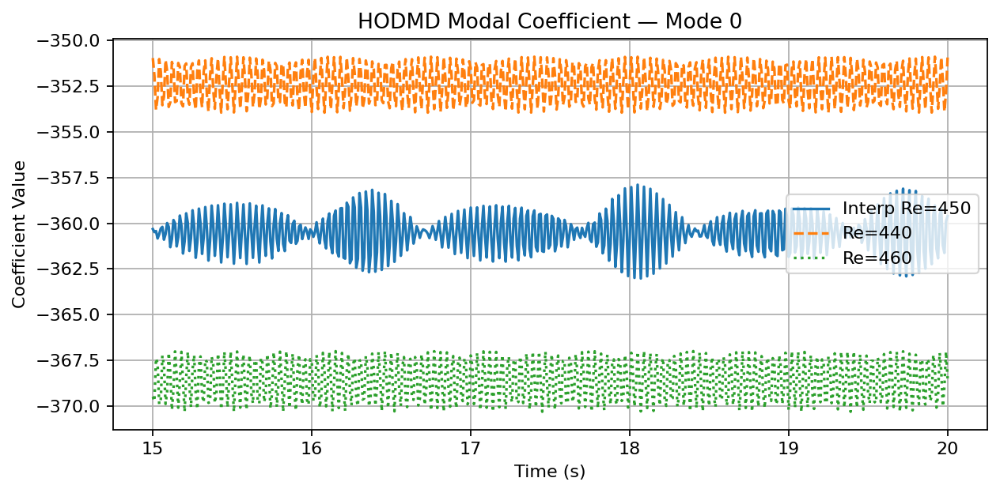

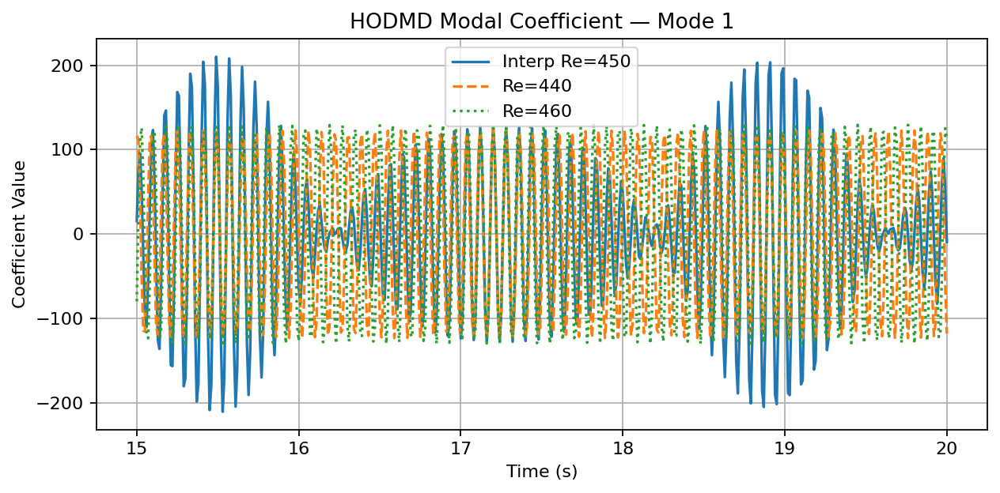

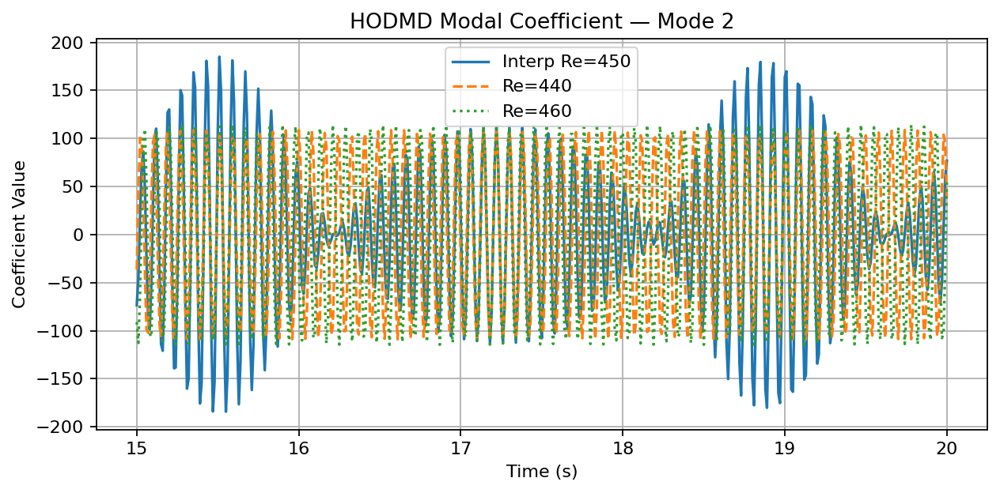

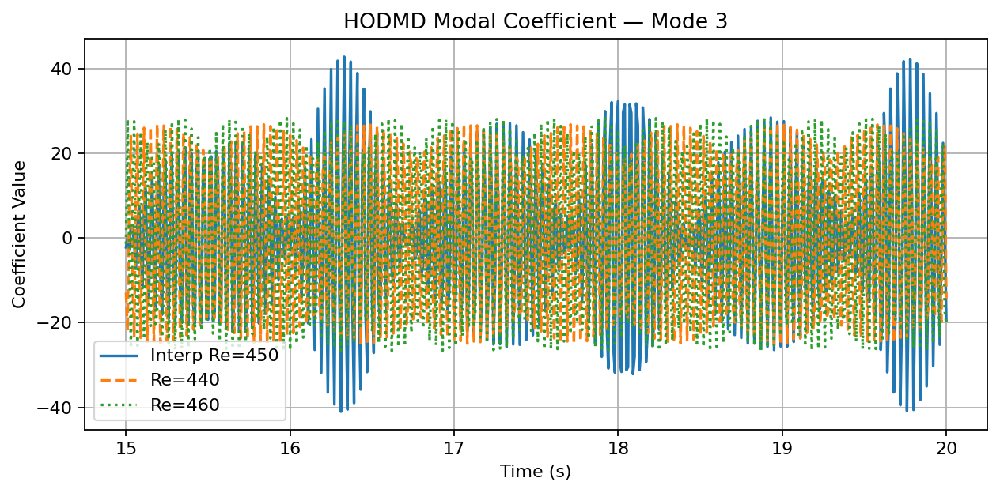

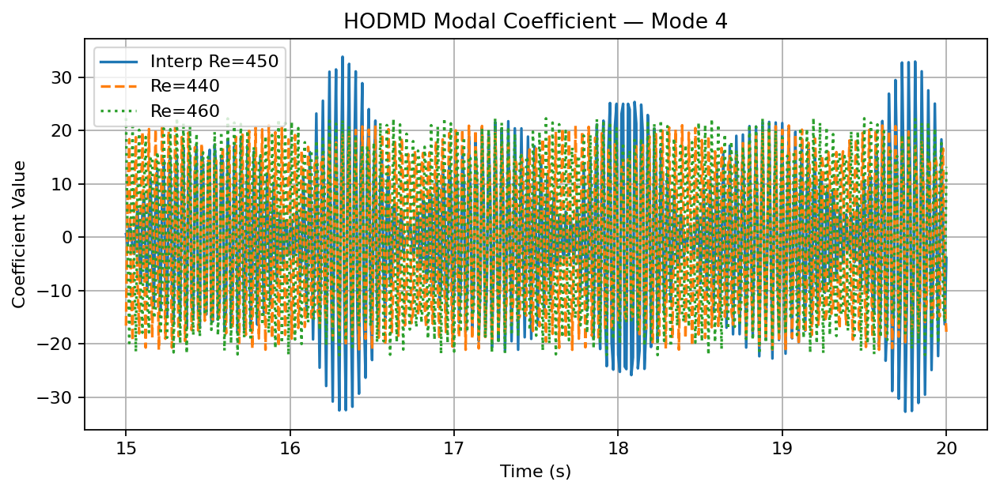

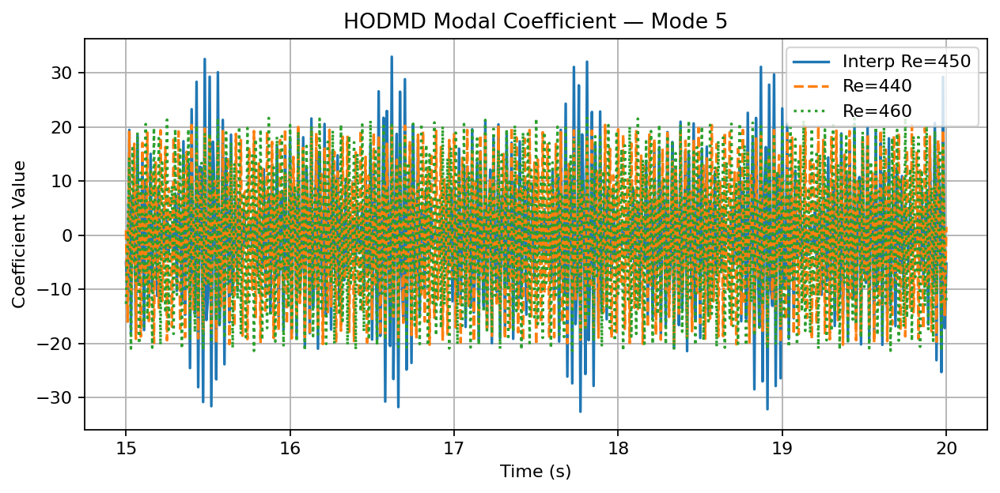

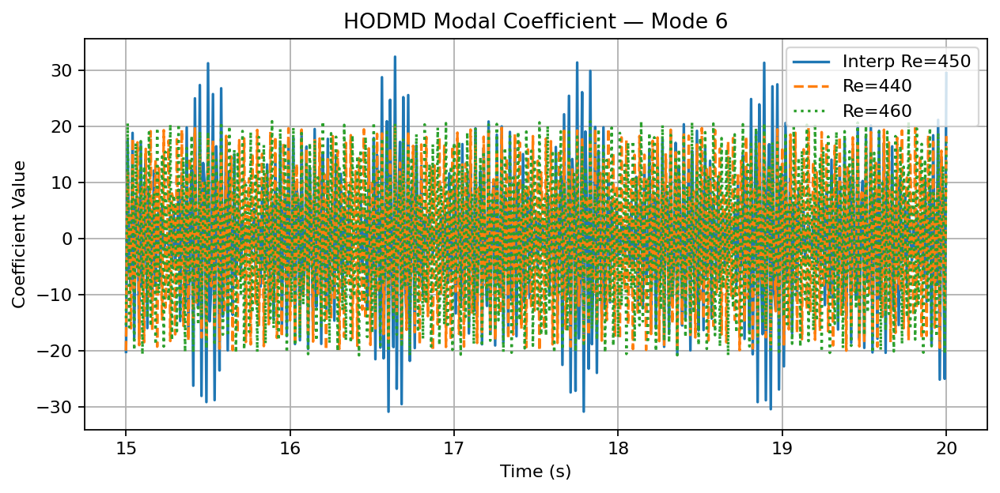

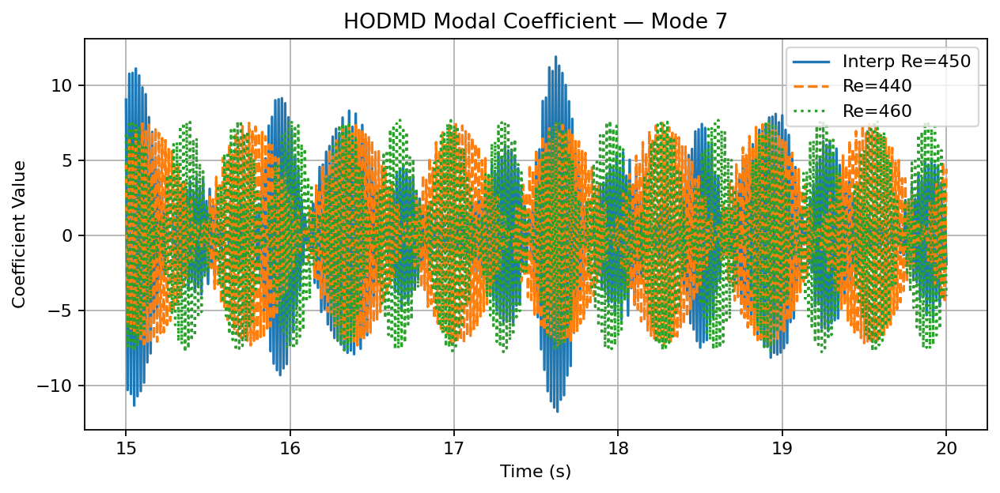

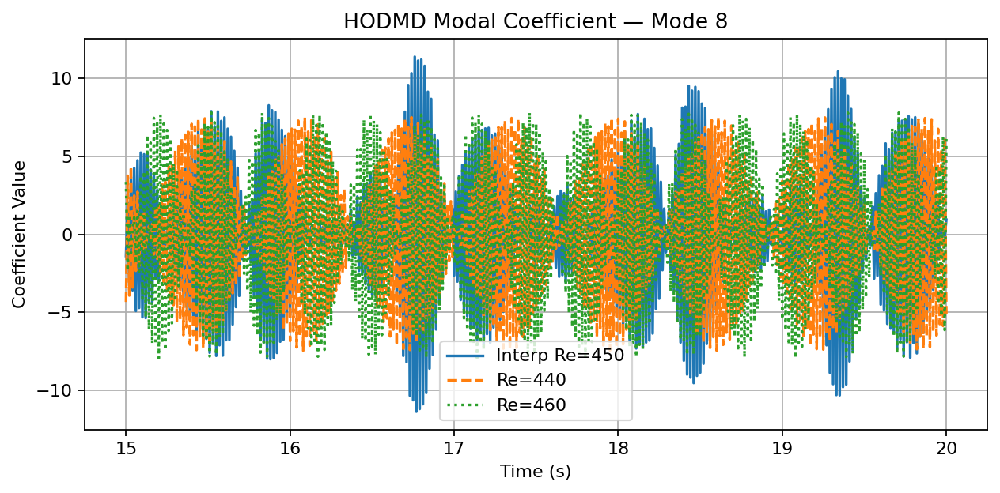

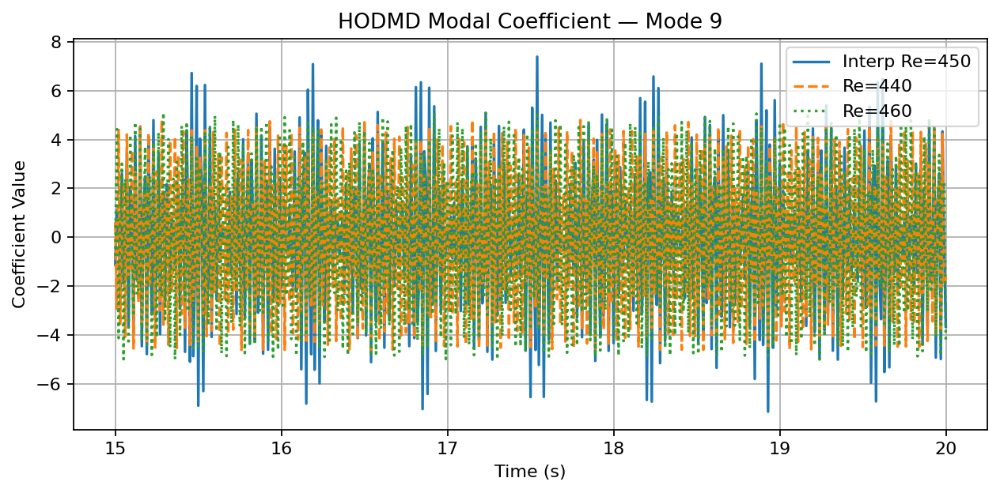

In [33]:
# Time series comparsion of the modal coefficients between interpolated and trained Re

# Extract modal coefficients
coeffs_interp = interpolated_pod  # shape: (modes, time)
coeffs_440 = forecasted_pod_dict[440]
coeffs_460 = forecasted_pod_dict[460]
timesteps = hodmd_dict[Re_list[0]].dmd_timesteps[:coeffs_440.shape[1]]

# Plot each mode separately
for i in range(min(10, coeffs_interp.shape[0])):
    plt.figure(figsize=(8, 4))
    plt.plot(timesteps, coeffs_interp[i][:len(timesteps)], label="Interp Re=450", linestyle='-')
    plt.plot(timesteps, coeffs_440[i], label="Re=440", linestyle='--')
    plt.plot(timesteps, coeffs_460[i], label="Re=460", linestyle=':')
    plt.title(f"HODMD Modal Coefficient — Mode {i}")
    plt.xlabel("Time (s)")
    plt.ylabel("Coefficient Value")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [34]:
# Define path and loader
Re_test = 450
path_test = "/home/haseeb/OpenFOAM/test/cylinder_2D_Re450"
sampling_step_test = 1  # Adjust as needed

# Initialize loader
loader_test = FOAMDataloader(path_test)
times_test = loader_test.write_times

# Define time windows
window_times_test = [t for t in times_test if 3.0 <= float(t) <= 20.0]
sampled_times_test = window_times_test[::sampling_step_test]

# Create spatial mask for cylinder region
vertices_test = loader_test.vertices[:, :2]
mask_test = mask_box(vertices_test, lower=[0.1, -1], upper=[0.75, 1])

# Load masked velocity snapshots
def load_masked_matrix(loader, mask, times):
    num_points = mask.sum().item()
    num_times = len(times)
    data_matrix = pt.zeros((2 * num_points, num_times), dtype=pt.float64)

    for i, time in enumerate(times):
        snapshot = loader.load_snapshot("U", time)
        ux_masked = pt.masked_select(snapshot[:, 0], mask)
        uy_masked = pt.masked_select(snapshot[:, 1], mask)
        data_matrix[:num_points, i] = ux_masked
        data_matrix[num_points:, i] = uy_masked

    return data_matrix.numpy(), num_points

snapshot_test, num_points_test = load_masked_matrix(loader_test, mask_test, sampled_times_test)

# Confirm shape
print(f"Loaded true snapshots for Re = {Re_test}: {snapshot_test.shape}")


INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor0/constant
INFO:flowtorch.data.foam_dataloader:Loading precomputed cell centers and volumes from processor1/constant


Loaded true snapshots for Re = 450: (11492, 1701)


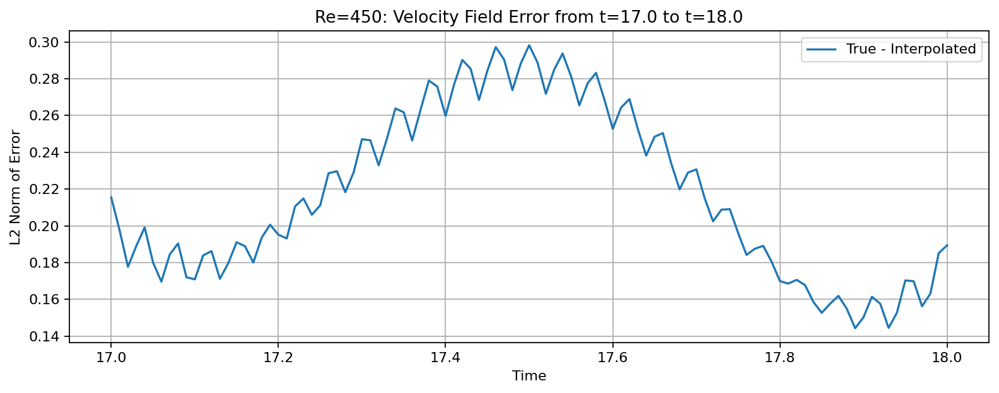

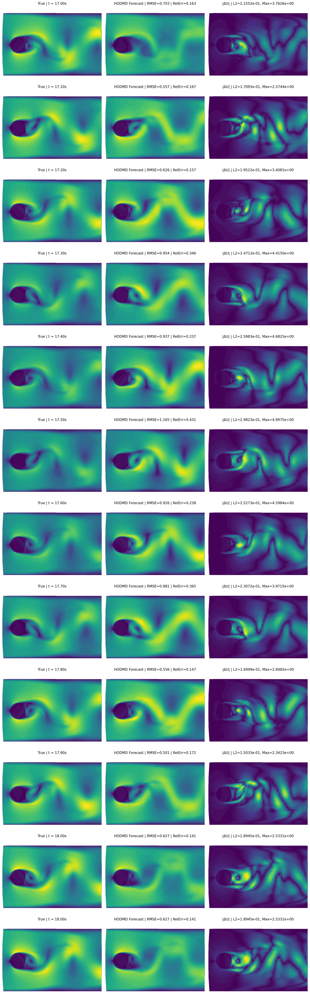

In [35]:

# Custom visualization controls
t_start = 17.0
t_end = 18.0
granularity = 0.1

# Align time windows
sampled_times_float = np.array(sampled_times_test, dtype=float)
forecast_mask = (sampled_times_float >= t_start) & (sampled_times_float <= t_end)
forecast_indices = np.where(forecast_mask)[0]
snapshot_aligned = snapshot_test[:, forecast_indices]
times_aligned = sampled_times_float[forecast_indices]

# Get interpolated reconstruction at Re=450
reconstructed = forecasted_field
num_points = num_points_test
ux_interp = reconstructed[:num_points, :]
uy_interp = reconstructed[num_points:, :]
reconstructed_masked = np.vstack([ux_interp, uy_interp])
reconstructed_masked = reconstructed_masked[:, :snapshot_aligned.shape[1]]

# Compute relative error field
true_norm = np.linalg.norm(snapshot_aligned, axis=0)
error_field = snapshot_aligned - reconstructed_masked
error_norm = np.linalg.norm(error_field, axis=0) / true_norm  # Relative L2 error

# Plot error norm over time
plt.figure(figsize=(10, 4))
plt.plot(times_aligned, error_norm, label="True - Interpolated")
plt.title(f"Re=450: Velocity Field Error from t={t_start} to t={t_end}")
plt.xlabel("Time")
plt.ylabel("L2 Norm of Error")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Visualize snapshots with error annotations
selected_times = np.arange(t_start, t_end + granularity, granularity)
selected_indices = [np.argmin(np.abs(times_aligned - t)) for t in selected_times]
n_frames = len(selected_indices)

fig, axes = plt.subplots(n_frames, 3, figsize=(15, 4 * n_frames))
for row, idx in enumerate(selected_indices):
    t = times_aligned[idx]
    true_u = snapshot_aligned[:num_points, idx].real
    true_v = snapshot_aligned[num_points:, idx].real
    interp_u = reconstructed_masked[:num_points, idx].real
    interp_v = reconstructed_masked[num_points:, idx].real

    true_mag = np.sqrt(true_u**2 + true_v**2)
    interp_mag = np.sqrt(interp_u**2 + interp_v**2)
    error_mag = np.abs(true_mag - interp_mag)

    # Error metrics
    l2_error = error_norm[idx]
    max_error = np.max(error_mag)
    rmse = np.sqrt(np.mean(error_mag**2))
    rel_err = np.mean(error_mag / (true_mag + 1e-8))

    vmin = min(true_mag.min(), interp_mag.min())
    vmax = max(true_mag.max(), interp_mag.max())

    # True field
    axes[row, 0].tricontourf(vertices_test[mask_test, 0], vertices_test[mask_test, 1],
                             true_mag, levels=50, cmap="viridis", vmin=vmin, vmax=vmax)
    axes[row, 0].set_title(f"True | t = {t:.2f}s", fontsize=12)
    axes[row, 0].axis("equal")
    axes[row, 0].axis("off")

    # Interpolated field
    axes[row, 1].tricontourf(vertices_test[mask_test, 0], vertices_test[mask_test, 1],
                             interp_mag, levels=50, cmap="viridis", vmin=vmin, vmax=vmax)
    axes[row, 1].set_title(f"HODMD Forecast | RMSE={rmse:.3f} | RelErr={rel_err:.3f}", fontsize=12)
    axes[row, 1].axis("equal")
    axes[row, 1].axis("off")

    # Error field with metrics
    axes[row, 2].tricontourf(vertices_test[mask_test, 0], vertices_test[mask_test, 1],
                             error_mag, levels=50, cmap="viridis")
    axes[row, 2].set_title(f"|ΔU| | L2={l2_error:.4e}, Max={max_error:.4e}", fontsize=12)
    axes[row, 2].axis("equal")
    axes[row, 2].axis("off")

plt.tight_layout()
plt.show()



INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.PillowWriter'>


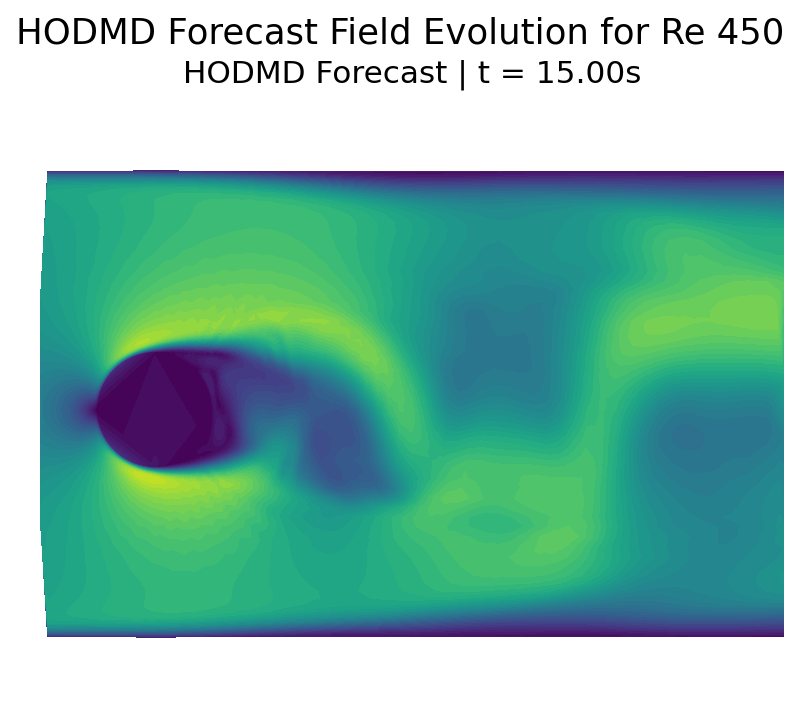

In [36]:
import matplotlib.animation as animation
from matplotlib.animation import PillowWriter

import matplotlib.animation as animation
from matplotlib.animation import PillowWriter

# CONFIGURATION
field_to_plot = "interp"       # options: "true", "interp"
t_start = 15.0                 # Start time (s)
t_end = 20.0                   # End time (s)
granularity = 5               # Sample every nth time step

# Step 1: Filter time indices
sampled_times_float = np.array(sampled_times_test, dtype=float)
forecast_mask = (sampled_times_float >= t_start) & (sampled_times_float <= t_end)
forecast_indices = np.where(forecast_mask)[0][::granularity]
snapshot_aligned = snapshot_test[:, forecast_indices]
times_aligned = sampled_times_float[forecast_indices]

# Step 2: Align forecasted field
reconstructed = forecasted_field[:, :snapshot_aligned.shape[1]]
num_points = num_points_test
ux_interp = reconstructed[:num_points, :]
uy_interp = reconstructed[num_points:, :]
reconstructed_masked = np.vstack([ux_interp, uy_interp])

# Step 3: Prepare figure
fig, ax = plt.subplots(figsize=(6, 5))
fig.suptitle("HODMD Forecast Field Evolution for Re 450", fontsize=16)
ax.axis("equal")
ax.axis("off")

# Initial frame
true_u0 = snapshot_aligned[:num_points, 0].real
true_v0 = snapshot_aligned[num_points:, 0].real
interp_u0 = reconstructed_masked[:num_points, 0].real
interp_v0 = reconstructed_masked[num_points:, 0].real

true_mag0 = np.sqrt(true_u0**2 + true_v0**2)
interp_mag0 = np.sqrt(interp_u0**2 + interp_v0**2)

vmin = min(true_mag0.min(), interp_mag0.min())
vmax = max(true_mag0.max(), interp_mag0.max())

field0 = {"true": true_mag0, "interp": interp_mag0}[field_to_plot]
ax.tricontourf(vertices_test[mask_test, 0], vertices_test[mask_test, 1],
               field0, levels=50, cmap="viridis", vmin=vmin, vmax=vmax)

# Step 4: Animation update function
def update(frame_idx):
    t = times_aligned[frame_idx]
    true_u = snapshot_aligned[:num_points, frame_idx].real
    true_v = snapshot_aligned[num_points:, frame_idx].real
    interp_u = reconstructed_masked[:num_points, frame_idx].real
    interp_v = reconstructed_masked[num_points:, frame_idx].real

    true_mag = np.sqrt(true_u**2 + true_v**2)
    interp_mag = np.sqrt(interp_u**2 + interp_v**2)

    field = {"true": true_mag, "interp": interp_mag}[field_to_plot]

    ax.clear()
    ax.set_title(f"HODMD Forecast | t = {t:.2f}s", fontsize=14)
    ax.axis("equal")
    ax.axis("off")
    ax.tricontourf(vertices_test[mask_test, 0], vertices_test[mask_test, 1],
                   field, levels=50, cmap="viridis", vmin=vmin, vmax=vmax)

# Step 5: Create and save GIF
ani = animation.FuncAnimation(fig, update, frames=len(times_aligned), blit=False, interval=100)
ani.save(f"HODMD_forecast_Re450_{t_start:.0f}to{t_end:.0f}_g{granularity}.gif", writer=PillowWriter(fps=10))


## Step 2: Stabilize the DMD models 